# Machine Learning in a Nutshell
05.12.2019

**Marco Kemmerling, Chrismarie Enslin**   
**Cybernetics Lab IMA & IfU**

In [1]:
import warnings
warnings.filterwarnings('ignore')

# Data Exploration

## Data Import

At first we will import the data and check the shape of it.

To do:

* Import the Gear Shaft dataset stored in the .csv file called 'Gear_Shaft_Dataset.csv' by using pandas. This will create a Dataframe of the data.
* Print out the first few lines of of the dataframe
* Check the shape of the data (i.e. the number of rows and columns)
* Rename 'class' to 'class_label' and print out a list of the column names

In [2]:
import pandas as pd
df_data = pd.read_csv('Gear_Shaft_Dataset.csv', delimiter=';', header=0)
df_data.head()

,Turning_Cut_Depth,Milling_Gear_Depth,Drilling_Surf_Quality,Drill_Pressure,Turning_Rotation_Speed,Drilling_Speed,Milling_Circle_Diameter,Turning_Cut_Speed,Drilling_Diameter,Turning_Shaft_Diameter,class
0,0.637494,0.310224,0.004732,3.493444,38.438535,42.662545,49.151251,1.244546,1.458960,0.100880,OK
1,0.652844,0.320212,0.004732,1.274442,39.551515,43.531334,49.179602,1.312920,1.522850,0.100293,OK
2,0.617482,0.288820,0.003994,1.729314,37.690105,43.455439,49.172410,1.199105,1.517454,0.102054,OK
3,0.595691,0.290698,0.005260,4.746772,38.070763,43.163878,49.167025,1.222921,1.495762,0.100000,OK
4,0.603474,0.309191,0.003827,1.961616,38.626447,42.834841,49.169505,1.257468,1.470745,0.101174,OK


In [3]:
df_data.shape

(10000, 11)

We are also interested in a summary of each of the variables. For example the mininmum, maximum, mean, etc.

To do:

* Run a command to create such a description per variable
* Run a command to investigate the class labels, determine how large each class is

In [4]:
df_data.describe()

,Turning_Cut_Depth,Milling_Gear_Depth,Drilling_Surf_Quality,Drill_Pressure,Turning_Rotation_Speed,Drilling_Speed,Milling_Circle_Diameter,Turning_Cut_Speed,Drilling_Diameter,Turning_Shaft_Diameter
count,9989.000000,9991.000000,9990.000000,9976.000000,9988.000000,9987.000000,9988.000000,9987.000000,9987.000000,9991.000000
mean,0.620283,0.317660,0.518787,2.992198,31.668279,43.587005,49.155461,0.830850,1.526328,0.425099
std,0.052734,0.039477,0.284308,1.146554,4.073884,2.171858,0.181184,0.248838,0.160293,0.225916
min,0.438529,0.200000,0.000000,1.000000,20.000000,37.907771,34.154053,0.100000,1.108587,0.100000
25%,0.586970,0.294798,0.316480,2.008489,28.683045,42.067167,49.143034,0.648005,1.414750,0.209888
50%,0.622533,0.310770,0.495771,2.970487,31.775417,43.504936,49.161670,0.836492,1.520169,0.527054
75%,0.648649,0.339918,0.722019,3.979186,34.954364,45.221185,49.174364,1.031588,1.646402,0.628140
max,0.800000,0.443355,1.000000,5.000000,41.874653,50.000000,50.000000,1.463049,1.997237,1.184624


In [5]:
df_data['class'].value_counts()

OK         5009
Failure    4991
Name: class, dtype: int64

In [6]:
df_data = df_data.rename(columns={"class": "class_label"})
df_data.columns

Index(['Turning_Cut_Depth', 'Milling_Gear_Depth', 'Drilling_Surf_Quality',
       'Drill_Pressure', 'Turning_Rotation_Speed', 'Drilling_Speed',
       'Milling_Circle_Diameter', 'Turning_Cut_Speed', 'Drilling_Diameter',
       'Turning_Shaft_Diameter', 'class_label'],
      dtype='object')

# Data preprocessing

## Handling NAs

We need to determine where we might have missing values in the dataset

Todo:

* Combine two pandas commands to check which entries in the dataframe are missing and to count the number of missing values per parameter
* Drop the rows containing missing values from the dataframe and save this in a new dataframe called "df_data_clean"
* Check the shape of the data frame again and check the class sizes again to confirm that we still have a good balance between the classes

In [7]:
df_data.isna().sum()

Turning_Cut_Depth          11
Milling_Gear_Depth          9
Drilling_Surf_Quality      10
Drill_Pressure             24
Turning_Rotation_Speed     12
Drilling_Speed             13
Milling_Circle_Diameter    12
Turning_Cut_Speed          13
Drilling_Diameter          13
Turning_Shaft_Diameter      9
class_label                 0
dtype: int64

In [8]:
df_data_clean = df_data.dropna(how = 'any')

In [9]:
df_data_clean.shape

(9876, 11)

In [10]:
df_data_clean.class_label.value_counts()

Failure    4961
OK         4915
Name: class_label, dtype: int64

## Encoding

We need to transform the class labels from text to binary values to be able to perform a classification.
This means we need create a the outcome variable with a value 0 if the class is 'Failure' and a value 1 if the class is 'OK'.
For this we will use the scikit-learn's preprocessing capabilities.

Todo:
* Use the function LabelEncoder to transform the class labels from text to values.
* Check that you have transformed the data as intented

In [11]:
from sklearn import preprocessing

encoder = preprocessing.LabelEncoder()

df_data_clean.class_label = encoder.fit_transform(df_data_clean.class_label)

In [12]:
df_data_clean.class_label.value_counts()

0    4961
1    4915
Name: class_label, dtype: int64

## Data Visualization

### Scatterplots, Histograms and Distribution plots

For quick visualisations of all the variables in our dataset we use the package seaborn. This package has the capability to produce a matris of scatterplots and also the histograms and distributions per parameter.

Todo:
* Using the imported seaborn package create a matrix of scatterplots and histograms to inspect our variables visually
Hint: This can be done with one short command
* We will realise that the plots are not completely useful without colour-coding according to class labels. Therefore add one more input to your seaborn command to produce a matrix of scatterplots colour-coded according to class label.


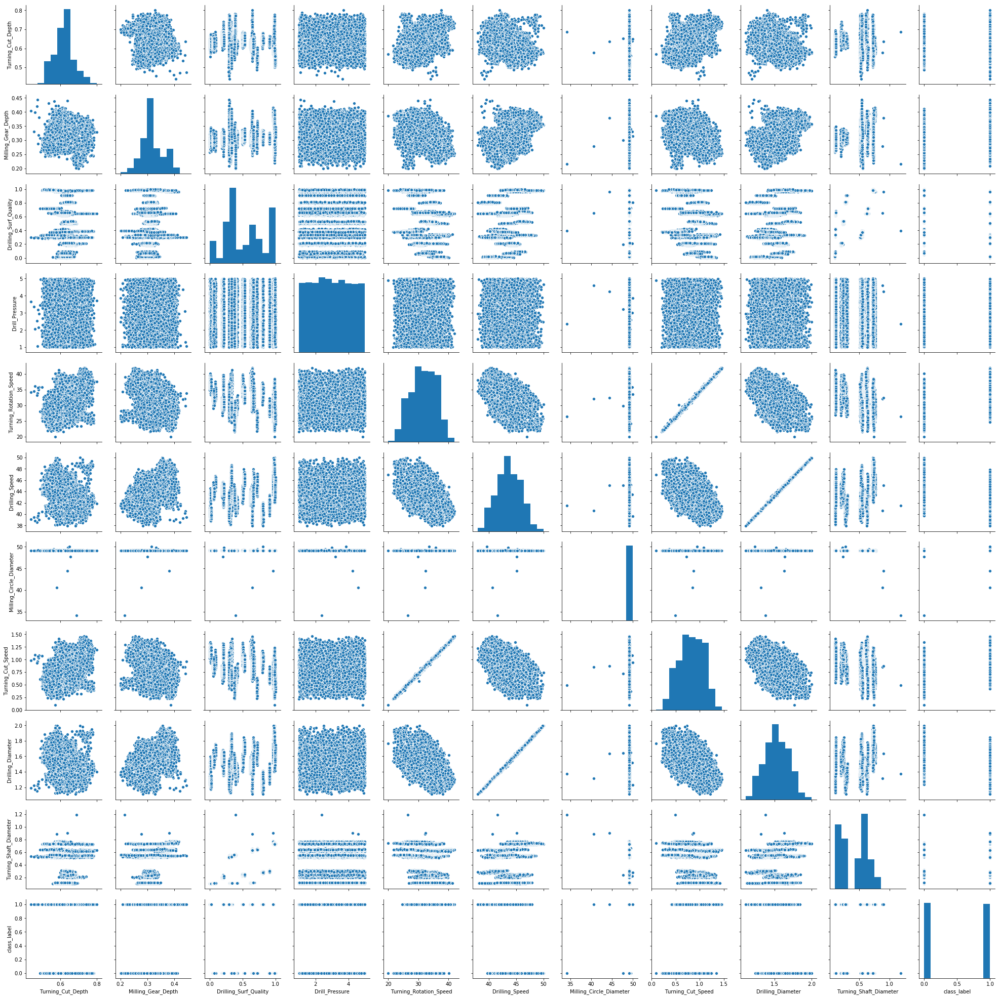

In [13]:
import numpy as np
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt

sns.pairplot(df_data_clean)

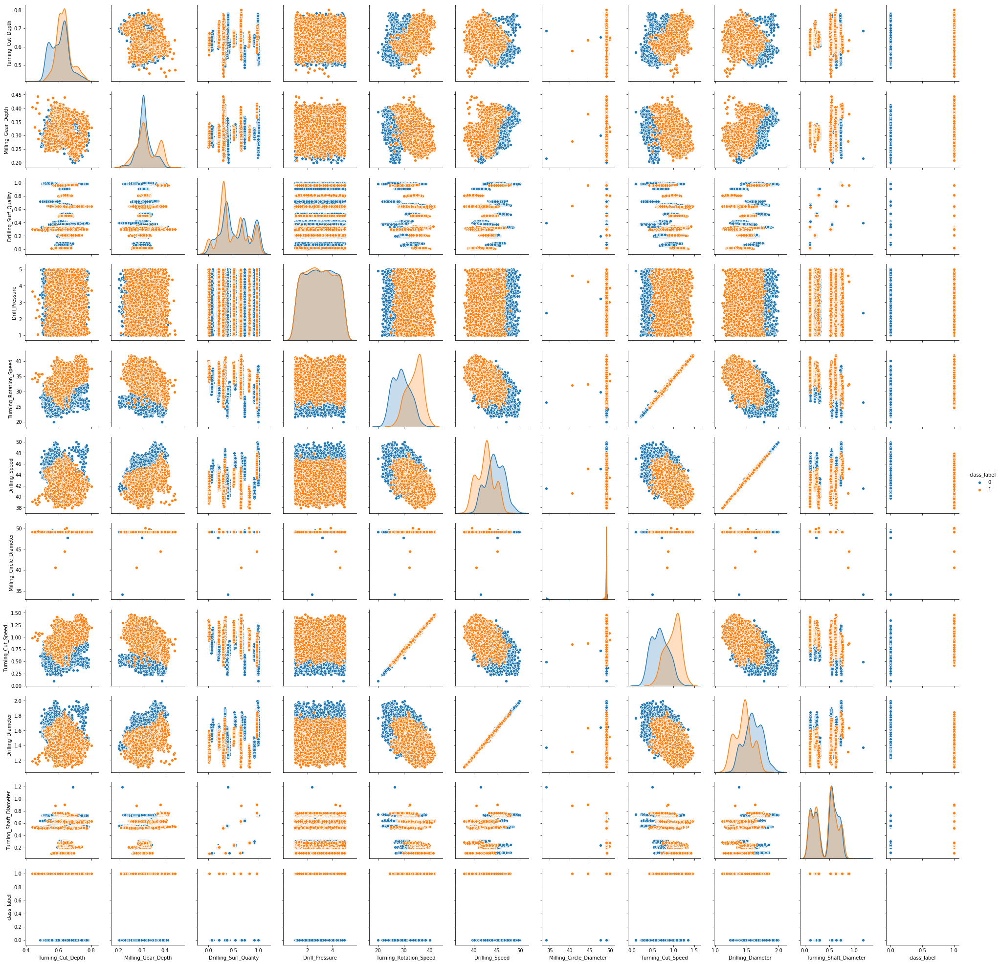

In [14]:
sns.pairplot(df_data_clean, hue = "class_label")

### Correlation-Matrix

We will now analyse the correlations between our variables.

Todo:
* Calculate the correlation matrix and save it in a separate dataframe called 'corrData'
* Take the absolute value of the correlations, as a high negative correlation is just a detrimental as a high positive correlation.
Hint: These two steps can be combined into one command.
* Print out the correlation matrix and inspect the values.
* For better understanding use the seaborn package and create a heatmap of the correlation values
Hint: For the heatmap, round the correlation values to 2 decimals and also print the actual correlation values on the heatmap.
* Interpret the results.

In [17]:
corrData = df_data_clean.corr().abs()
corrData

,Turning_Cut_Depth,Milling_Gear_Depth,Drilling_Surf_Quality,Drill_Pressure,Turning_Rotation_Speed,Drilling_Speed,Milling_Circle_Diameter,Turning_Cut_Speed,Drilling_Diameter,Turning_Shaft_Diameter,class_label
Turning_Cut_Depth,1.000000,0.203568,0.135407,0.003424,0.495853,0.305035,0.016419,0.494937,0.302924,0.242961,0.233958
Milling_Gear_Depth,0.203568,1.000000,0.266805,0.018544,0.276803,0.359502,0.022718,0.280133,0.358865,0.338612,0.132085
Drilling_Surf_Quality,0.135407,0.266805,1.000000,0.006930,0.297637,0.173104,0.020260,0.297738,0.171393,0.522504,0.107795
Drill_Pressure,0.003424,0.018544,0.006930,1.000000,0.005173,0.002848,0.005105,0.005468,0.003121,0.001357,0.012304
Turning_Rotation_Speed,0.495853,0.276803,0.297637,0.005173,1.000000,0.410800,0.039906,0.999554,0.408827,0.484771,0.619208
Drilling_Speed,0.305035,0.359502,0.173104,0.002848,0.410800,1.000000,0.015308,0.411055,0.999682,0.319770,0.476556
Milling_Circle_Diameter,0.016419,0.022718,0.020260,0.005105,0.039906,0.015308,1.000000,0.041089,0.015344,0.112817,0.002984
Turning_Cut_Speed,0.494937,0.280133,0.297738,0.005468,0.999554,0.411055,0.041089,1.000000,0.409094,0.486872,0.616776
Drilling_Diameter,0.302924,0.358865,0.171393,0.003121,0.408827,0.999682,0.015344,0.409094,1.000000,0.316396,0.476455
Turning_Shaft_Diameter,0.242961,0.338612,0.522504,0.001357,0.484771,0.319770,0.112817,0.486872,0.316396,1.000000,0.008950


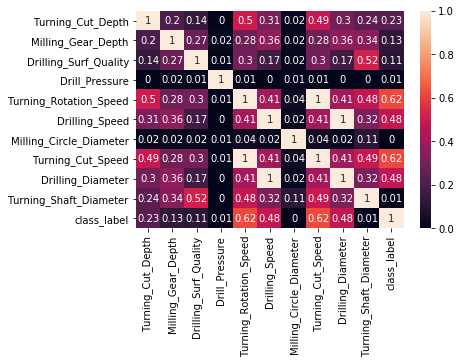

In [18]:
sns.heatmap(round(corrData,2), annot = True)